In [1]:
import pandas as pd
import mat_to_csv as mat
import seaborn as sns
import matplotlib.pyplot as plt
import feature_extract as fe
import scipy.ndimage.filters as filters
from sklearn.metrics import auc
from scipy.stats import linregress
from glob import glob
import  kaleido

In [2]:
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.express as px
init_notebook_mode(connected=True)  
import cufflinks as cf
cf.go_offline() 
plt.rcParams['figure.figsize'] = [15, 10]

In [3]:

def add_features(df):
    df_cell = pd.DataFrame()

    for i in df['charge_cycle'].unique():
        data = df[df['charge_cycle'] == i]
        
        #take constant current region
        data = data[(data['Voltage_measured'] < 4.18) & (data['Current_charge'] >= 1.4)]
        
        # charge in Ah
        data['charge'] = (data['Time'] * data['Current_measured']) / 3600

        data['incremental_capacity'] = data['charge'].diff(periods=6) / data['Voltage_measured'].diff(periods=6)
        data['incremental_capacity_smooth'] = filters.gaussian_filter1d(data['incremental_capacity'],sigma=20)
        data['incremental_capacity_ma'] = data['incremental_capacity'].rolling(20).mean()
    
        df_cell = df_cell.append(data,ignore_index=True)
     
    return df_cell


In [4]:
df = pd.read_csv('csv/charge_cycle_all.csv')


In [5]:
data = df[df['Battery'] == 'B0007']
data = add_features(data)
data = data.dropna()
data

,Time,Current_charge,Voltage_charge,Temperature_measured,Current_measured,Voltage_measured,charge_cycle,Battery,charge,incremental_capacity,incremental_capacity_smooth,incremental_capacity_ma
86,265.828,1.4995,4.859,25.275466,1.490020,4.128867,1.0,B0007,0.110025,2.574391,2.452291,2.467879
87,269.157,1.4995,4.859,25.291445,1.488077,4.129204,1.0,B0007,0.111257,2.817878,2.464703,2.497027
88,272.469,1.4995,4.859,25.297009,1.489985,4.129837,1.0,B0007,0.112771,2.415535,2.476547,2.501692
89,275.875,1.4995,4.859,25.307082,1.491707,4.130651,1.0,B0007,0.114312,2.439629,2.487840,2.504065
90,279.219,1.4995,4.859,25.316093,1.491133,4.131109,1.0,B0007,0.115654,2.511772,2.498592,2.509220
...,...,...,...,...,...,...,...,...,...,...,...,...
145071,1885.890,1.4995,4.922,27.601429,1.492804,4.178207,169.0,B0007,0.782018,2.677398,2.444267,2.491144
145072,1888.562,1.4995,4.922,27.613169,1.490199,4.178556,169.0,B0007,0.781759,2.042002,2.444384,2.486022
145073,1891.328,1.4995,4.922,27.626798,1.489732,4.179000,169.0,B0007,0.782659,2.157400,2.444470,2.511928
145074,1894.000,1.4995,4.922,27.640580,1.489770,4.179180,169.0,B0007,0.783785,2.532688,2.444535,2.501113


In [13]:
cycle = [10,20,100,150,180]
ft_x = 'Voltage_measured'
ft_y = 'incremental_capacity_smooth'
title = 'Incremental Capacity Curve'

plots = {}
for c in cycle:
    plot_data = data[data['charge_cycle'] == c]
    plots[c] = go.Scatter(x = plot_data[ft_x], y = plot_data[ft_y],name=c)
traces = list(plots.values())
mylayout = go.Layout(
    title = title,
    xaxis_title="Voltage",
    yaxis_title="dQ/dV",xaxis=dict(
        range=[3.93, 4.15]
    )
    )
fig = go.Figure(data = traces , layout = mylayout)
#fig.write_image('figures/incremental_capacity.png', scale=2)
iplot(fig)

In [179]:
cycle_data = data.groupby(['charge_cycle'], sort=False)['incremental_capacity_smooth'].max()
cycle_data = cycle_data.reset_index(name='max_height')

In [106]:
cycle_data.isna()

charge_cycle    0
max_height      0
dtype: int64

In [232]:
cycle_to_soh = ((cycle_data['charge_cycle'].max()-cycle_data['charge_cycle'])/cycle_data['charge_cycle'].max())*100

ht = go.Scatter(x = cycle_to_soh, y = cycle_data['max_height'])
iplot([ht])

KeyError: 'max_height'

In [23]:
cycle = [10,20,30,40,50,100,120,130,140,150]
plots = {}
for c in cycle:
    plot_data = data[data['charge_cycle'] == c]
    plots[c] = go.Scatter(x = plot_data['Time'], y = plot_data['Voltage_measured'], name = c)

traces = list(plots.values())
mylayout = go.Layout(
    title = 'Charge Cycle - CC',
    xaxis_title="Time (sec)",
    yaxis_title="Voltage ")
fig = go.Figure(data = traces , layout = mylayout)
#fig.write_image('figures/figure.png', scale=2)
iplot(fig)


In [104]:
x = plot_data['Time'].values
y = plot_data['Voltage_measured'].values
area = auc(x,y)
area

3769.940591846199

In [15]:
def create_cycle_data(df):
    cycle_data = df.groupby(['charge_cycle'], sort=False)['incremental_capacity_smooth'].max()
    cycle_data = cycle_data.reset_index(name='max_height_ic')
    cycle_data['gaussian_height'] = filters.gaussian_filter1d(cycle_data['max_height_ic'],sigma=20)
    cycle_data['normalize_height'] = cycle_data['gaussian_height']/cycle_data['gaussian_height'].max()
    #grp_data = df.loc[df.groupby(['charge_cycle'])['Voltage_measured'].idxmax()]
    #cycle_data['time_max'] = grp_data['Time'].values
    #cycle_data['charge_max'] = grp_data['charge'].values
    #temp = df.groupby(['charge_cycle'])['Temperature_measured'].mean()
    #temp = temp.reset_index()['Temperature_measured']
    #cycle_data['avg_temperature'] = temp
    area_vt = []
    area_ic = []
    for c in cycle_data['charge_cycle'].values:
        x = df[df['charge_cycle']==c]['Time'].values
        y = df[df['charge_cycle']==c]['Voltage_measured'].values
        area_vt.append(auc(x,y))
        
    cycle_data['auc_vt'] = area_vt
 
    cycle_data['slope_vt'] = df.groupby('charge_cycle').apply(lambda v: linregress(v.Time, v.Voltage_measured)[0])
   
    return cycle_data    

In [16]:
cd = create_cycle_data(add_features(df[df['Battery'] == 'B0055']).dropna())
cd

,charge_cycle,max_height_ic,gaussian_height,normalize_height,auc_vt,slope_vt
0,1.0,4.964590,3.653999,1.000000,2306.120931,NaN
1,2.0,3.793692,3.652347,0.999548,2502.923600,0.000101
2,3.0,4.514301,3.649052,0.998646,2796.593642,0.000162
3,4.0,3.566074,3.644136,0.997301,2623.846375,0.000112
4,5.0,8.231933,3.637619,0.995517,2209.215185,0.000139
...,...,...,...,...,...,...
97,98.0,2.398466,2.592090,0.709384,1349.263864,0.000153
98,99.0,2.288780,2.591792,0.709303,1092.712424,0.000165
99,100.0,3.126011,2.591569,0.709242,1080.608030,0.000166
100,101.0,2.435253,2.591422,0.709202,1562.459989,0.000118


<AxesSubplot:>

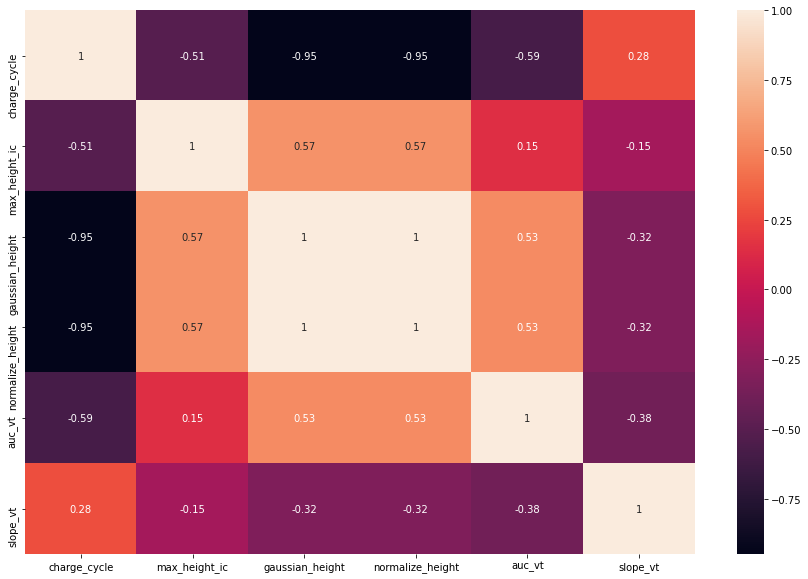

In [30]:
sns.heatmap(cd.corr(),annot=True)

In [17]:
#final dataset batteries
batteries = ['B0005','B0006','B0007','B0018','B0033','B0034','B0036']

In [18]:
cycle_data = pd.DataFrame()

for battery in batteries:
    data = df[df['Battery'] == battery]
    data = add_features(data)
    data = data.dropna()
    data = create_cycle_data(data)
    data['Battery'] = battery
    data['SOH']=((data['charge_cycle'].max()-data['charge_cycle'])/data['charge_cycle'].max())*100
    cycle_data = cycle_data.append(data,ignore_index=True)


In [19]:
#cycle_data.to_csv('csv/cycle_data.csv',index=False)
cycle_data

,charge_cycle,max_height_ic,gaussian_height,normalize_height,auc_vt,slope_vt,Battery,SOH
0,1.0,2.756590,5.001875,0.973257,1150.119424,NaN,B0005,99.408284
1,2.0,5.172427,5.002491,0.973377,11386.989114,0.000156,B0005,98.816568
2,3.0,5.113697,5.003717,0.973616,11371.530747,0.000108,B0005,98.224852
3,4.0,5.071102,5.005545,0.973972,11287.752979,0.000108,B0005,97.633136
4,5.0,5.027662,5.007959,0.974441,11325.585534,0.000109,B0005,97.041420
...,...,...,...,...,...,...,...,...
1212,193.0,3.742927,3.915229,0.827889,5756.384401,0.000111,B0036,2.030457
1213,194.0,3.723729,3.913964,0.827621,5717.790058,0.000121,B0036,1.522843
1214,195.0,3.636837,3.913006,0.827419,5413.290340,0.000122,B0036,1.015228
1215,196.0,3.585013,3.912370,0.827284,5201.624129,0.000124,B0036,0.507614


<AxesSubplot:>

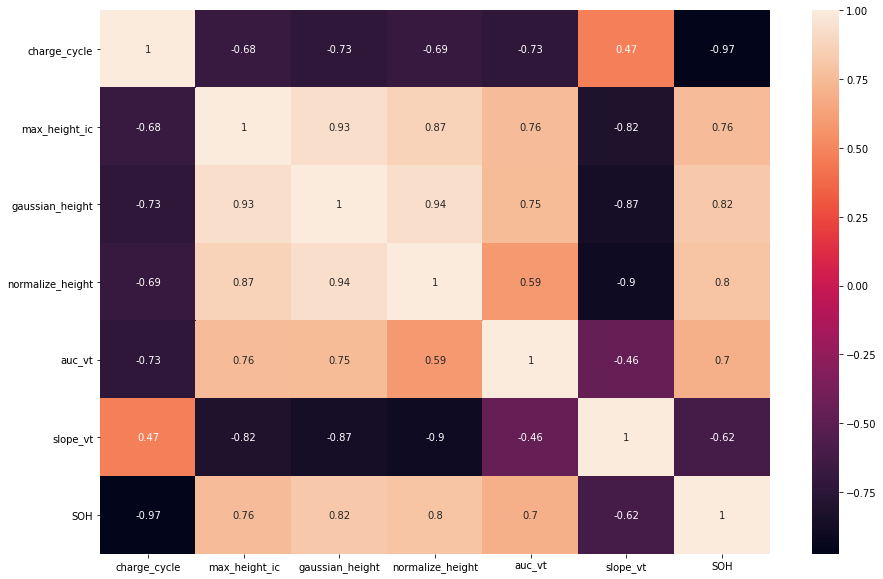

In [60]:
sns.heatmap(cycle_data.corr(),annot= True)

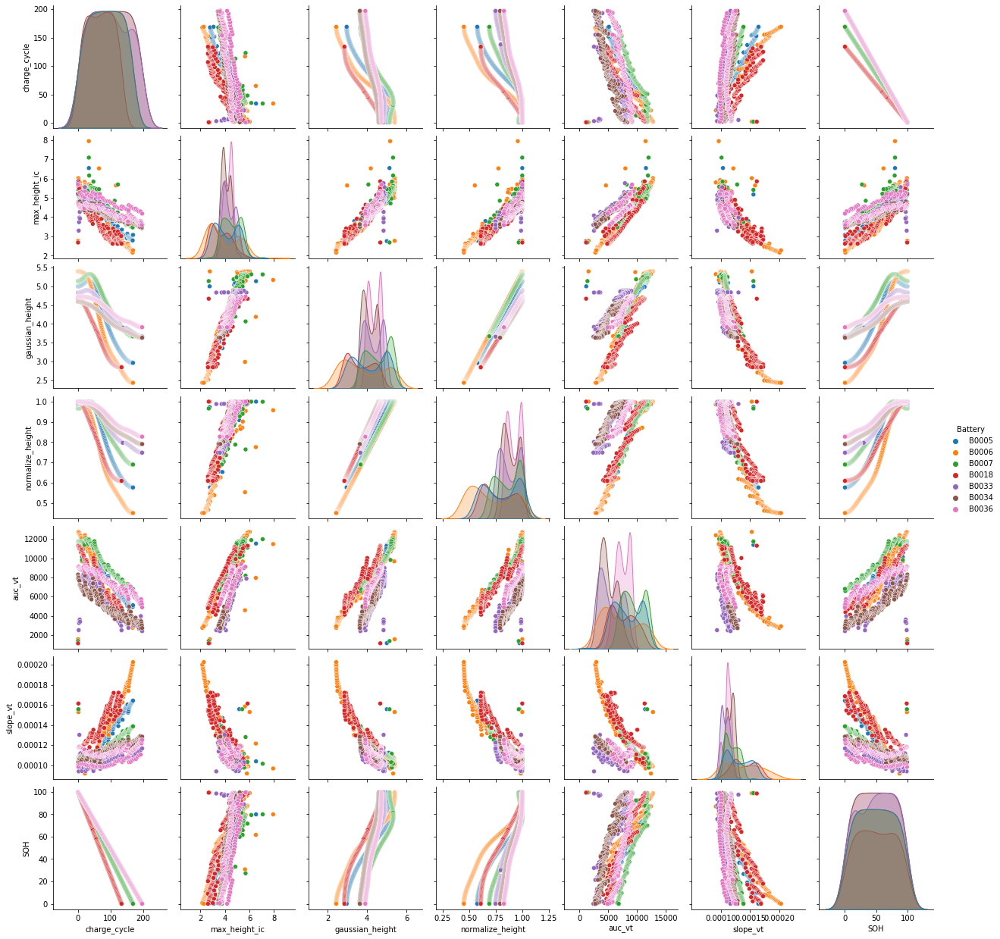

In [77]:
sns.pairplot(cycle_data,hue='Battery')

In [20]:
corr = []
for battery in batteries:
    plot_data = cycle_data[cycle_data['Battery'] == battery]
    corr.append(plot_data.corr()['charge_cycle']['slope_vt'])

px.bar(x=batteries,y=corr, color=batteries)

In [22]:

fig = px.scatter(cycle_data, x='SOH', y='auc_vt', color='Battery')
fig.write_image('figures/auc_vt.png', scale=2)
fig